In [21]:
import pandas as pd
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn import datasets
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
import matplotlib.pyplot as plt

## Converting .psv to .csv

In [2]:
import csv
import os
import pandas as pd
folder_path= r'D:\AI_DS\Quarter_2\Machine_learning\Project\Sepsis_DataSet\training_setA\training'
txt_files = os.listdir(folder_path)
to_csv = []
df2=pd.DataFrame()
count=1
for file in range(0, len(txt_files)):
    path_name = os.path.join(folder_path, txt_files[file])
    
    to_csv.append(path_name)

for file in to_csv:
    with open(file) as f:
        df1 = pd.read_csv(f, delimiter='|')
        df1['PatientId']=count
        df2=df2.append([df1])
    count=count+1

C:\Users\DELL\AppData\Local\Temp\ipykernel_1660\3951198111.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=df2.append([df1])
C:\Users\DELL\AppData\Local\Temp\ipykernel_1660\3951198111.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=df2.append([df1])
C:\Users\DELL\AppData\Local\Temp\ipykernel_1660\3951198111.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=df2.append([df1])
C:\Users\DELL\AppData\Local\Temp\ipykernel_1660\3951198111.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=df2.append([df1])
C:\Users\DELL\AppData\Local\Temp\ipykernel_1660\3951198111.py:18: FutureWarning: The frame.append method is 

In [4]:
df2.head()

,HR,O2Sat,Temp,SBP,MAP,DBP,Resp,EtCO2,BaseExcess,HCO3,...,Fibrinogen,Platelets,Age,Gender,Unit1,Unit2,HospAdmTime,ICULOS,SepsisLabel,PatientId
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,83.14,0,NaN,NaN,-0.03,1,0,1
1,97.0,95.0,NaN,98.0,75.33,NaN,19.0,NaN,NaN,NaN,...,NaN,NaN,83.14,0,NaN,NaN,-0.03,2,0,1
2,89.0,99.0,NaN,122.0,86.00,NaN,22.0,NaN,NaN,NaN,...,NaN,NaN,83.14,0,NaN,NaN,-0.03,3,0,1
3,90.0,95.0,NaN,NaN,NaN,NaN,30.0,NaN,24.0,NaN,...,NaN,NaN,83.14,0,NaN,NaN,-0.03,4,0,1
4,103.0,88.5,NaN,122.0,91.33,NaN,24.5,NaN,NaN,NaN,...,NaN,NaN,83.14,0,NaN,NaN,-0.03,5,0,1


In [5]:
df2.info 

<bound method DataFrame.info of        HR  O2Sat   Temp    SBP     MAP    DBP  Resp  EtCO2  BaseExcess  HCO3  \
0     NaN    NaN    NaN    NaN     NaN    NaN   NaN    NaN         NaN   NaN   
1    97.0   95.0    NaN   98.0   75.33    NaN  19.0    NaN         NaN   NaN   
2    89.0   99.0    NaN  122.0   86.00    NaN  22.0    NaN         NaN   NaN   
3    90.0   95.0    NaN    NaN     NaN    NaN  30.0    NaN        24.0   NaN   
4   103.0   88.5    NaN  122.0   91.33    NaN  24.5    NaN         NaN   NaN   
..    ...    ...    ...    ...     ...    ...   ...    ...         ...   ...   
28   88.0   98.0    NaN  135.0   81.00   64.0  16.0    NaN         NaN   NaN   
29   96.0   98.0  38.72  174.0   97.00   72.0  16.0    NaN         2.0   NaN   
30  140.0   97.0    NaN  133.0   81.50   62.5  16.0    NaN         NaN   NaN   
31  120.0   96.0    NaN  154.0  118.00  105.0  16.0    NaN         NaN   NaN   
32  115.0   95.0    NaN  150.0  117.00  104.0  16.0    NaN         NaN   NaN   

    ...

In [6]:
df2.describe

<bound method NDFrame.describe of        HR  O2Sat   Temp    SBP     MAP    DBP  Resp  EtCO2  BaseExcess  HCO3  \
0     NaN    NaN    NaN    NaN     NaN    NaN   NaN    NaN         NaN   NaN   
1    97.0   95.0    NaN   98.0   75.33    NaN  19.0    NaN         NaN   NaN   
2    89.0   99.0    NaN  122.0   86.00    NaN  22.0    NaN         NaN   NaN   
3    90.0   95.0    NaN    NaN     NaN    NaN  30.0    NaN        24.0   NaN   
4   103.0   88.5    NaN  122.0   91.33    NaN  24.5    NaN         NaN   NaN   
..    ...    ...    ...    ...     ...    ...   ...    ...         ...   ...   
28   88.0   98.0    NaN  135.0   81.00   64.0  16.0    NaN         NaN   NaN   
29   96.0   98.0  38.72  174.0   97.00   72.0  16.0    NaN         2.0   NaN   
30  140.0   97.0    NaN  133.0   81.50   62.5  16.0    NaN         NaN   NaN   
31  120.0   96.0    NaN  154.0  118.00  105.0  16.0    NaN         NaN   NaN   
32  115.0   95.0    NaN  150.0  117.00  104.0  16.0    NaN         NaN   NaN   

    .

In [13]:
df2.isnull().sum()/len(df2)*100

HR                    7.743336
O2Sat                12.032042
Temp                 66.224255
SBP                  15.211177
MAP                  10.232405
DBP                  48.125763
Resp                  9.776833
EtCO2               100.000000
BaseExcess           89.574863
HCO3                 91.949406
FiO2                 85.807027
pH                   88.532868
PaCO2                91.231753
SaO2                 95.044387
AST                  98.504205
BUN                  91.840702
Alkalinephos         98.540650
Calcium              95.024392
Chloride             91.676063
Creatinine           93.357884
Bilirubin_direct     99.850420
Glucose              87.768392
Lactate              96.565112
Magnesium            92.219712
Phosphate            94.951247
Potassium            89.137640
Bilirubin_total      98.773372
TroponinI            99.877881
Hct                  88.223711
Hgb                  91.164303
PTT                  95.152459
WBC                  92.489639
Fibrinog

## Finding correlation

In [14]:
df2.corr

<bound method DataFrame.corr of        HR  O2Sat   Temp    SBP     MAP    DBP  Resp  EtCO2  BaseExcess  HCO3  \
0     NaN    NaN    NaN    NaN     NaN    NaN   NaN    NaN         NaN   NaN   
1    97.0   95.0    NaN   98.0   75.33    NaN  19.0    NaN         NaN   NaN   
2    89.0   99.0    NaN  122.0   86.00    NaN  22.0    NaN         NaN   NaN   
3    90.0   95.0    NaN    NaN     NaN    NaN  30.0    NaN        24.0   NaN   
4   103.0   88.5    NaN  122.0   91.33    NaN  24.5    NaN         NaN   NaN   
..    ...    ...    ...    ...     ...    ...   ...    ...         ...   ...   
28   88.0   98.0    NaN  135.0   81.00   64.0  16.0    NaN         NaN   NaN   
29   96.0   98.0  38.72  174.0   97.00   72.0  16.0    NaN         2.0   NaN   
30  140.0   97.0    NaN  133.0   81.50   62.5  16.0    NaN         NaN   NaN   
31  120.0   96.0    NaN  154.0  118.00  105.0  16.0    NaN         NaN   NaN   
32  115.0   95.0    NaN  150.0  117.00  104.0  16.0    NaN         NaN   NaN   

    ...

## Plotting correlation of different features

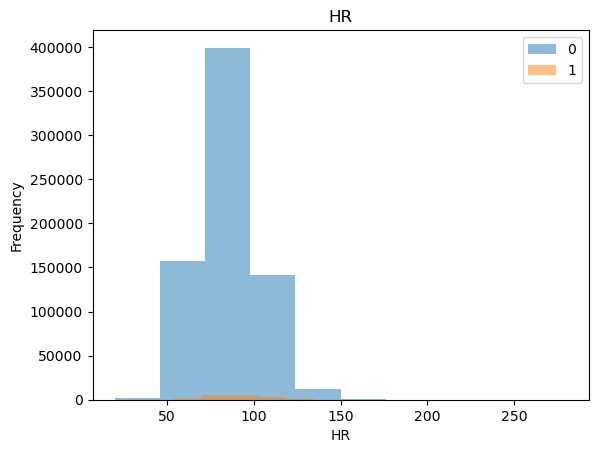

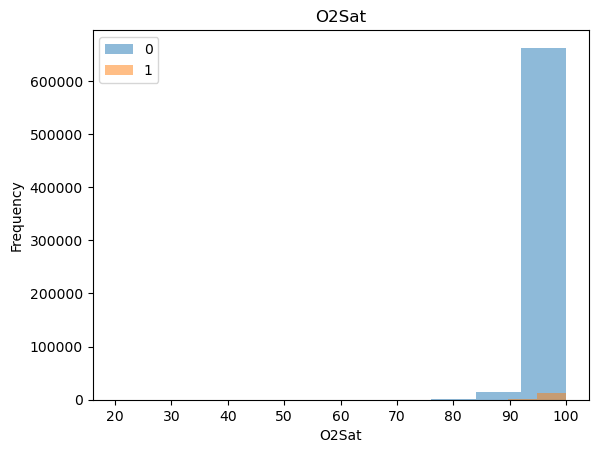

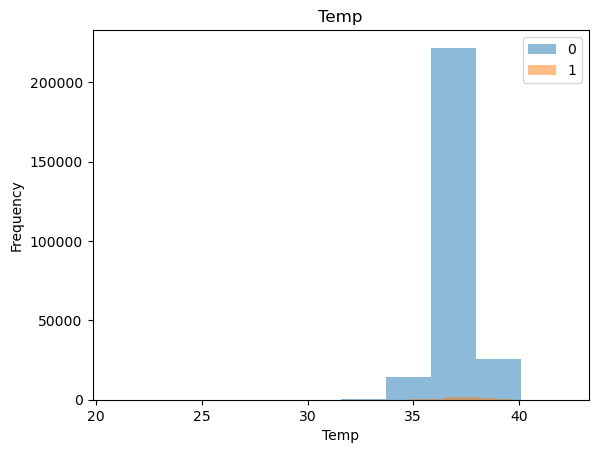

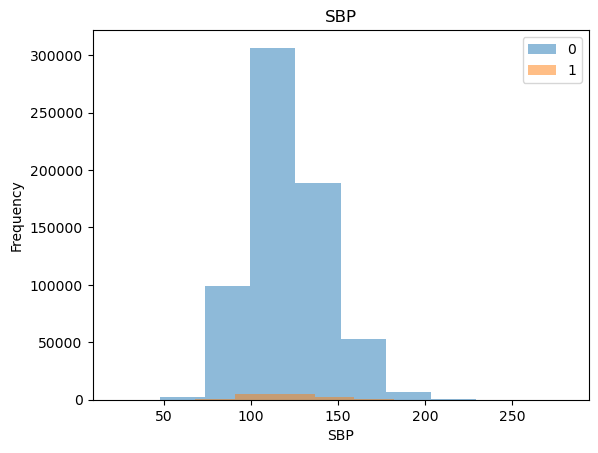

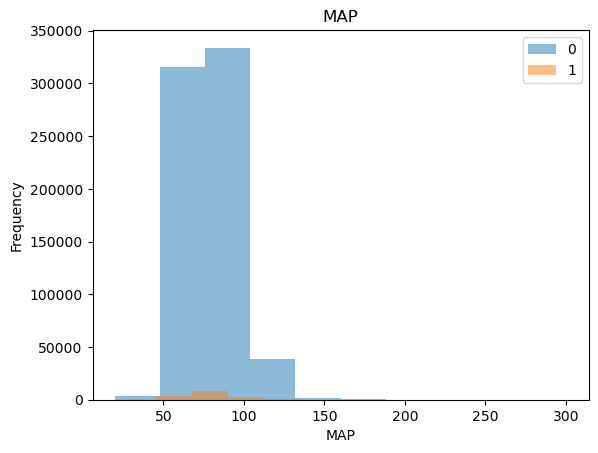

...

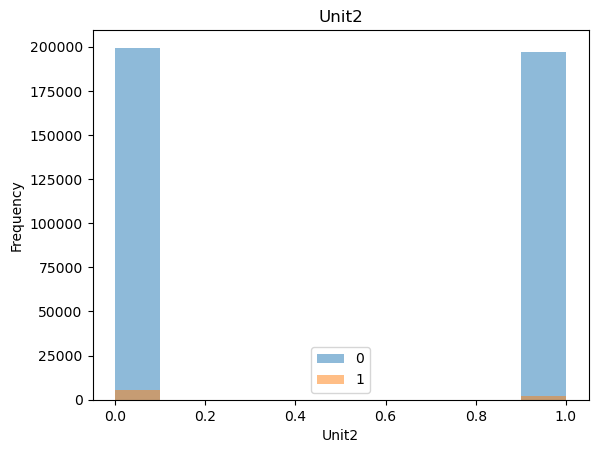

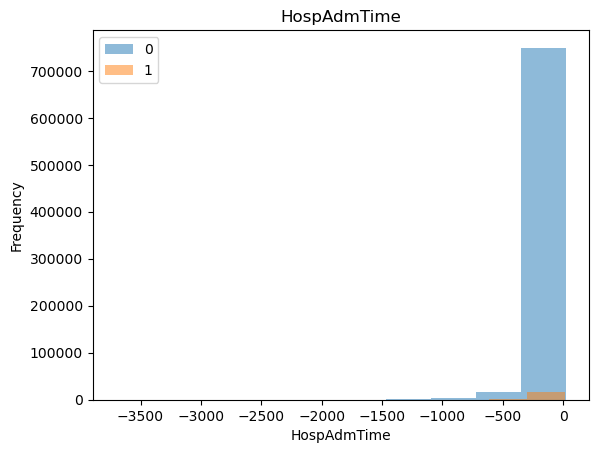

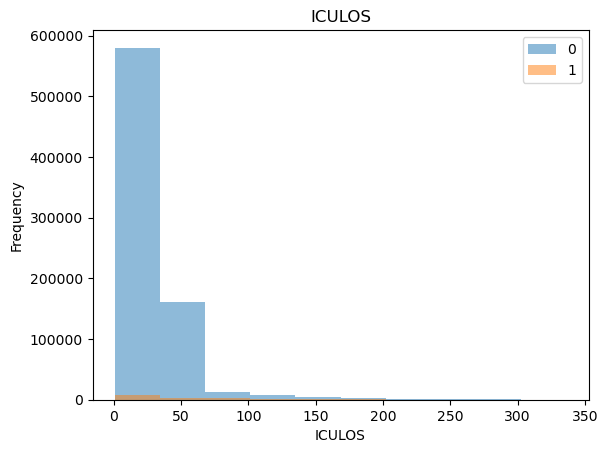

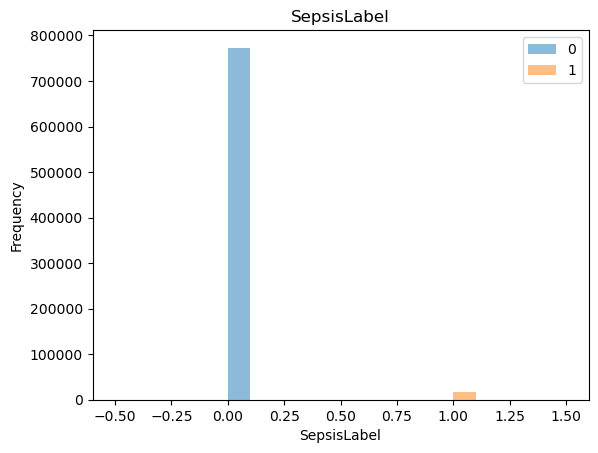

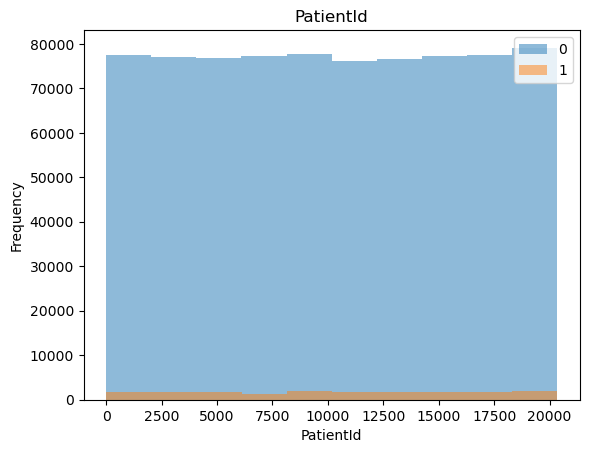

In [17]:
for i in (df2.select_dtypes(include=['int', 'int64', 'float', 'float64']).columns):
        bi_con_cat = df2.groupby(df2['SepsisLabel'])[i].plot.hist(alpha = 0.5)
        plt.xlabel(i)
        plt.legend(df2.groupby(df2['SepsisLabel'])[i].count().axes[0].tolist())
        plt.title(i)
        plt.show()

## Imputation using backward and forward fill


In [99]:
df3=pd.read_csv("test_dataset.csv")

In [100]:
df3=df3.groupby('PatientId')
df3=list(df3)

In [101]:
# Forward fill 
for i in range(len(df3)):
    df3[i][1].loc[:,cols] = df3[i][1].loc[:,cols].ffill()


In [102]:
# Backward fill
for i in range(len(df3)):
    df3[i][1].loc[:,cols] = df3[i][1].loc[:,cols].bfill()

In [103]:
dataset_test1=pd.DataFrame()
for i in range(len(df3)):
    dataset_test1=dataset_test1.append(pd.DataFrame(df3[i][1],columns=cols))

C:\Users\DELL\AppData\Local\Temp\ipykernel_22216\2605093708.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dataset_test1=dataset_test1.append(pd.DataFrame(df3[i][1],columns=cols))
C:\Users\DELL\AppData\Local\Temp\ipykernel_22216\2605093708.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dataset_test1=dataset_test1.append(pd.DataFrame(df3[i][1],columns=cols))
C:\Users\DELL\AppData\Local\Temp\ipykernel_22216\2605093708.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dataset_test1=dataset_test1.append(pd.DataFrame(df3[i][1],columns=cols))
C:\Users\DELL\AppData\Local\Temp\ipykernel_22216\2605093708.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pa

In [104]:
dataset_test1.to_csv('fb_test.csv')

In [105]:
import pandas as pd
test_bf=pd.read_csv('fb_test.csv')
train_bf=pd.read_csv('fb_train.csv')
pd.set_option('display.max_rows', None)

In [106]:
train_bf.head()

,Unnamed: 0,HR,O2Sat,Temp,SBP,MAP,DBP,Resp,EtCO2,BaseExcess,...,Fibrinogen,Platelets,Age,Gender,Unit1,Unit2,HospAdmTime,ICULOS,SepsisLabel,PatientId
0,0,97.0,95.0,36.11,98.0,75.33,NaN,19.0,NaN,24.0,...,NaN,317.0,83.14,0,NaN,NaN,-0.03,1,0,1
1,1,97.0,95.0,36.11,98.0,75.33,NaN,19.0,NaN,24.0,...,NaN,317.0,83.14,0,NaN,NaN,-0.03,2,0,1
2,2,89.0,99.0,36.11,122.0,86.00,NaN,22.0,NaN,24.0,...,NaN,317.0,83.14,0,NaN,NaN,-0.03,3,0,1
3,3,90.0,95.0,36.11,122.0,86.00,NaN,30.0,NaN,24.0,...,NaN,317.0,83.14,0,NaN,NaN,-0.03,4,0,1
4,4,103.0,88.5,36.11,122.0,91.33,NaN,24.5,NaN,24.0,...,NaN,317.0,83.14,0,NaN,NaN,-0.03,5,0,1


In [107]:
cols=['HR', 'O2Sat', 'Temp', 'SBP', 'MAP', 'DBP', 'Resp', 'EtCO2',
       'BaseExcess', 'HCO3', 'FiO2', 'pH', 'PaCO2', 'SaO2', 'AST', 'BUN',
       'Alkalinephos', 'Calcium', 'Chloride', 'Creatinine', 'Bilirubin_direct',
       'Glucose', 'Lactate', 'Magnesium', 'Phosphate', 'Potassium',
       'Bilirubin_total', 'TroponinI', 'Hct', 'Hgb', 'PTT', 'WBC',
       'Fibrinogen', 'Platelets', 'Age', 'Gender', 'Unit1', 'Unit2',
       'HospAdmTime', 'ICULOS','SepsisLabel','PatientId']


In [38]:
#New Feature ASBP(product of age*SBP) and Shock_Index(division of HR and SBP) and computing Median of 'HR' of individual patients.

dataset_test1['ASBP']=dataset_test1['Age']*dataset_test1['SBP']

dataset_test1['Shock_Index']=dataset_test1['HR']/dataset_test1['SBP']


## Model Building using Backward and Forward Fill

In [109]:
df_majority_test= test_bf[test_bf['SepsisLabel']==0]
df_minority_test= test_bf[test_bf['SepsisLabel']==1]

In [110]:
df_majority_downsampled = resample(df_majority_test, 
                                 replace=False,    
                                 n_samples=50000)
#Upsample minority class
df_minority_upsampled = resample(df_minority_test, 
                                 replace=True,     
                                 n_samples=50000)
# Combine minority class with downsampled majority class
test_bf = pd.concat([df_majority_downsampled, df_minority_upsampled])

In [111]:
df_majority_train= train_bf[train_bf['SepsisLabel']==0]
df_minority_train= train_bf[train_bf['SepsisLabel']==1]

In [112]:
df_majority_downsampled = resample(df_majority_test, 
                                 replace=False,    
                                 n_samples=50000)
#Upsample minority class
df_minority_upsampled = resample(df_minority_test, 
                                 replace=True,     
                                 n_samples=50000)
# Combine minority class with downsampled majority class
train_bf = pd.concat([df_majority_downsampled, df_minority_upsampled])

In [120]:
for i in cols:
   train_bf[i]=train_bf[i].fillna(train_bf[i].mean())

for i in cols:
    test_bf[i]=test_bf[i].fillna(test_bf[i].mean())

In [121]:
X_Train=train_bf[['HR', 'O2Sat', 'Temp', 'SBP', 'MAP', 'DBP', 'Resp',
        'BaseExcess', 'HCO3', 'FiO2', 'pH', 'PaCO2', 'SaO2', 'AST',
       'BUN', 'Alkalinephos', 'Calcium', 'Chloride', 'Creatinine',
       'Bilirubin_direct', 'Glucose', 'Lactate', 'Magnesium', 'Phosphate',
       'Potassium', 'Bilirubin_total', 'TroponinI', 'Hct', 'Hgb', 'PTT', 'WBC',
       'Fibrinogen', 'Platelets', 'Age', 'Gender', 'Unit1', 'Unit2',
       'HospAdmTime', 'ICULOS',  'PatientId']]
y_Train=train_bf['SepsisLabel']

X_Test=test_bf[['HR', 'O2Sat', 'Temp', 'SBP', 'MAP', 'DBP', 'Resp',
        'BaseExcess', 'HCO3', 'FiO2', 'pH', 'PaCO2', 'SaO2', 'AST',
       'BUN', 'Alkalinephos', 'Calcium', 'Chloride', 'Creatinine',
       'Bilirubin_direct', 'Glucose', 'Lactate', 'Magnesium', 'Phosphate',
       'Potassium', 'Bilirubin_total', 'TroponinI', 'Hct', 'Hgb', 'PTT', 'WBC',
       'Fibrinogen', 'Platelets', 'Age', 'Gender', 'Unit1', 'Unit2',
       'HospAdmTime', 'ICULOS',  'PatientId']]
y_Test=test_bf['SepsisLabel']

In [122]:

model = RandomForestClassifier(n_estimators=100,random_state=None,max_features = 'sqrt',n_jobs=-1, verbose = 1)
model.fit(X_Train,y_Train)
y_pred = model.predict(X_Test)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    3.7s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.1s finished


In [123]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

print(confusion_matrix(y_Test,y_pred))
print(classification_report(y_Test,y_pred))
print(accuracy_score(y_Test,y_pred))

[[49613   387]
 [    4 49996]]
              precision    recall  f1-score   support

           0       1.00      0.99      1.00     50000
           1       0.99      1.00      1.00     50000

    accuracy                           1.00    100000
   macro avg       1.00      1.00      1.00    100000
weighted avg       1.00      1.00      1.00    100000

0.99609


In [124]:
from sklearn.linear_model import LogisticRegression
classifier = LogisticRegression(random_state = 0)
classifier.fit(X_Train,y_Train)
y_pred = classifier.predict(X_Test)

c:\Users\DELL\miniconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [125]:
print(confusion_matrix(y_Test,y_pred))
print(classification_report(y_Test,y_pred))
print(accuracy_score(y_Test,y_pred))

[[37598 12402]
 [19101 30899]]
              precision    recall  f1-score   support

           0       0.66      0.75      0.70     50000
           1       0.71      0.62      0.66     50000

    accuracy                           0.68    100000
   macro avg       0.69      0.68      0.68    100000
weighted avg       0.69      0.68      0.68    100000

0.68497


In [126]:
# Fitting XGBoost to the training data
my_model = xgb.XGBClassifier()
my_model.fit(X_Train, y_Train)
 
# Predicting the Test set results
y_pred = my_model.predict(X_Test)
 
# Making the Confusion Matrix
cm = confusion_matrix(y_Test,y_pred)

In [127]:
print(confusion_matrix(y_Test,y_pred))
print(classification_report(y_Test,y_pred))
print(accuracy_score(y_Test,y_pred))

[[47647  2353]
 [  608 49392]]
              precision    recall  f1-score   support

           0       0.99      0.95      0.97     50000
           1       0.95      0.99      0.97     50000

    accuracy                           0.97    100000
   macro avg       0.97      0.97      0.97    100000
weighted avg       0.97      0.97      0.97    100000

0.97039


In [128]:
from sklearn.naive_bayes import GaussianNB
classifier = GaussianNB()
classifier.fit(X_Train, y_Train)
y_pred = classifier.predict(X_Test)

In [129]:
print(confusion_matrix(y_Test,y_pred))
print(classification_report(y_Test,y_pred))
print(accuracy_score(y_Test,y_pred))

[[43831  6169]
 [30179 19821]]
              precision    recall  f1-score   support

           0       0.59      0.88      0.71     50000
           1       0.76      0.40      0.52     50000

    accuracy                           0.64    100000
   macro avg       0.68      0.64      0.61    100000
weighted avg       0.68      0.64      0.61    100000

0.63652


In [130]:
from sklearn.linear_model import SGDClassifier
sgd=SGDClassifier(loss='modified_huber',shuffle=True,random_state=101)
sgd.fit(X_Train, y_Train)
y_pred = classifier.predict(X_Test)

In [131]:
print(confusion_matrix(y_Test,y_pred))
print(classification_report(y_Test,y_pred))
print(accuracy_score(y_Test,y_pred))

[[43831  6169]
 [30179 19821]]
              precision    recall  f1-score   support

           0       0.59      0.88      0.71     50000
           1       0.76      0.40      0.52     50000

    accuracy                           0.64    100000
   macro avg       0.68      0.64      0.61    100000
weighted avg       0.68      0.64      0.61    100000

0.63652


In [132]:
from sklearn.neighbors import KNeighborsClassifier
knn=KNeighborsClassifier(n_neighbors=15)
knn.fit(X_Train, y_Train)
y_pred = classifier.predict(X_Test)

In [133]:
print(confusion_matrix(y_Test,y_pred))
print(classification_report(y_Test,y_pred))
print(accuracy_score(y_Test,y_pred))

[[43831  6169]
 [30179 19821]]
              precision    recall  f1-score   support

           0       0.59      0.88      0.71     50000
           1       0.76      0.40      0.52     50000

    accuracy                           0.64    100000
   macro avg       0.68      0.64      0.61    100000
weighted avg       0.68      0.64      0.61    100000

0.63652


## Using Upsampling and Downsampling on imputed mean

In [134]:
import pandas as pd
test_mean=pd.read_csv('test_mean.csv')
train_mean=pd.read_csv('train_mean.csv')
pd.set_option('display.max_rows', None)

In [135]:
df_majority_test= test_mean[test_mean['SepsisLabel']==0]
df_minority_test= test_mean[test_mean['SepsisLabel']==1]

In [136]:
df_majority_downsampled = resample(df_majority_test, 
                                 replace=False,    
                                 n_samples=50000)
#Upsample minority class
df_minority_upsampled = resample(df_minority_test, 
                                 replace=True,     
                                 n_samples=50000)
# Combine minority class with downsampled majority class
test_mean = pd.concat([df_majority_downsampled, df_minority_upsampled])

In [137]:
df_majority_train= train_mean[train_mean['SepsisLabel']==0]
df_minority_train= train_mean[train_mean['SepsisLabel']==1]

In [138]:
df_majority_downsampled = resample(df_majority_train, 
                                 replace=False,    
                                 n_samples=1000)
#Upsample minority class
df_minority_upsampled = resample(df_minority_train, 
                                 replace=True,     
                                 n_samples=1000)
# Combine minority class with downsampled majority class
train_mean = pd.concat([df_majority_downsampled, df_minority_upsampled])

In [139]:
for i in cols:
   train_mean[i]=train_mean[i].fillna(train_mean[i].median())

for i in cols:
    test_mean[i]=test_mean[i].fillna(test_mean[i].median())

c:\Users\DELL\miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)


In [140]:
X_Train=train_mean[['HR', 'O2Sat', 'Temp', 'SBP', 'MAP', 'DBP', 'Resp',
        'BaseExcess', 'HCO3', 'FiO2', 'pH', 'PaCO2', 'SaO2', 'AST',
       'BUN', 'Alkalinephos', 'Calcium', 'Chloride', 'Creatinine',
       'Bilirubin_direct', 'Glucose', 'Lactate', 'Magnesium', 'Phosphate',
       'Potassium', 'Bilirubin_total', 'TroponinI', 'Hct', 'Hgb', 'PTT', 'WBC',
       'Fibrinogen', 'Platelets', 'Age', 'Gender', 'Unit1', 'Unit2',
       'HospAdmTime', 'ICULOS',  'PatientId']]
y_Train=train_mean['SepsisLabel']

X_Test=test_mean[['HR', 'O2Sat', 'Temp', 'SBP', 'MAP', 'DBP', 'Resp',
        'BaseExcess', 'HCO3', 'FiO2', 'pH', 'PaCO2', 'SaO2', 'AST',
       'BUN', 'Alkalinephos', 'Calcium', 'Chloride', 'Creatinine',
       'Bilirubin_direct', 'Glucose', 'Lactate', 'Magnesium', 'Phosphate',
       'Potassium', 'Bilirubin_total', 'TroponinI', 'Hct', 'Hgb', 'PTT', 'WBC',
       'Fibrinogen', 'Platelets', 'Age', 'Gender', 'Unit1', 'Unit2',
       'HospAdmTime', 'ICULOS',  'PatientId']]
y_Test=test_mean['SepsisLabel']

In [69]:

model = RandomForestClassifier(n_estimators=100,random_state=None,max_features = 'sqrt',n_jobs=-1, verbose = 1)
model.fit(X_Train,y_Train)
y_pred = model.predict(X_Test)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.1s finished


In [70]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

print(confusion_matrix(y_Test,y_pred))
print(classification_report(y_Test,y_pred))
print(accuracy_score(y_Test,y_pred))

[[44997  5003]
 [27720 22280]]
              precision    recall  f1-score   support

           0       0.62      0.90      0.73     50000
           1       0.82      0.45      0.58     50000

    accuracy                           0.67    100000
   macro avg       0.72      0.67      0.65    100000
weighted avg       0.72      0.67      0.65    100000

0.67277


In [71]:
from sklearn.linear_model import LogisticRegression
classifier = LogisticRegression(random_state = 0)
classifier.fit(X_Train,y_Train)
y_pred = classifier.predict(X_Test)

c:\Users\DELL\miniconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [72]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

print(confusion_matrix(y_Test,y_pred))
print(classification_report(y_Test,y_pred))
print(accuracy_score(y_Test,y_pred))

[[39343 10657]
 [22027 27973]]
              precision    recall  f1-score   support

           0       0.64      0.79      0.71     50000
           1       0.72      0.56      0.63     50000

    accuracy                           0.67    100000
   macro avg       0.68      0.67      0.67    100000
weighted avg       0.68      0.67      0.67    100000

0.67316


In [73]:
# Fitting XGBoost to the training data
my_model = xgb.XGBClassifier()
my_model.fit(X_Train, y_Train)
 
# Predicting the Test set results
y_pred = my_model.predict(X_Test)
 
# Making the Confusion Matrix
cm = confusion_matrix(y_Test,y_pred)

In [74]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

print(confusion_matrix(y_Test,y_pred))
print(classification_report(y_Test,y_pred))
print(accuracy_score(y_Test,y_pred))

[[43541  6459]
 [24949 25051]]
              precision    recall  f1-score   support

           0       0.64      0.87      0.73     50000
           1       0.80      0.50      0.61     50000

    accuracy                           0.69    100000
   macro avg       0.72      0.69      0.67    100000
weighted avg       0.72      0.69      0.67    100000

0.68592


In [75]:
from sklearn.naive_bayes import GaussianNB
classifier = GaussianNB()
classifier.fit(X_Train, y_Train)
y_pred = classifier.predict(X_Test)

In [76]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

print(confusion_matrix(y_Test,y_pred))
print(classification_report(y_Test,y_pred))
print(accuracy_score(y_Test,y_pred))

[[41830  8170]
 [28495 21505]]
              precision    recall  f1-score   support

           0       0.59      0.84      0.70     50000
           1       0.72      0.43      0.54     50000

    accuracy                           0.63    100000
   macro avg       0.66      0.63      0.62    100000
weighted avg       0.66      0.63      0.62    100000

0.63335


In [77]:
from sklearn.linear_model import SGDClassifier
sgd=SGDClassifier(loss='modified_huber',shuffle=True,random_state=101)
sgd.fit(X_Train, y_Train)
y_pred = classifier.predict(X_Test)

In [78]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

print(confusion_matrix(y_Test,y_pred))
print(classification_report(y_Test,y_pred))
print(accuracy_score(y_Test,y_pred))

[[41830  8170]
 [28495 21505]]
              precision    recall  f1-score   support

           0       0.59      0.84      0.70     50000
           1       0.72      0.43      0.54     50000

    accuracy                           0.63    100000
   macro avg       0.66      0.63      0.62    100000
weighted avg       0.66      0.63      0.62    100000

0.63335


In [141]:
from sklearn.neighbors import KNeighborsClassifier
knn=KNeighborsClassifier(n_neighbors=15)
knn.fit(X_Train, y_Train)
y_pred = classifier.predict(X_Test)

In [142]:
print(confusion_matrix(y_Test,y_pred))
print(classification_report(y_Test,y_pred))
print(accuracy_score(y_Test,y_pred))

[[43867  6133]
 [29871 20129]]
              precision    recall  f1-score   support

           0       0.59      0.88      0.71     50000
           1       0.77      0.40      0.53     50000

    accuracy                           0.64    100000
   macro avg       0.68      0.64      0.62    100000
weighted avg       0.68      0.64      0.62    100000

0.63996


## Using Upsampling and Downsampling on imputed median

In [151]:
import pandas as pd
test_median=pd.read_csv('medtest.csv')
train_median=pd.read_csv('medtrain.csv')
pd.set_option('display.max_rows', None)

In [152]:
from sklearn.utils import resample

In [153]:
df_majority_test= test_median[test_median['SepsisLabel']==0]
df_minority_test= test_median[test_median['SepsisLabel']==1]

In [154]:
df_majority_downsampled = resample(df_majority_test, 
                                 replace=False,    
                                 n_samples=500000)
#Upsample minority class
df_minority_upsampled = resample(df_minority_test, 
                                 replace=True,     
                                 n_samples=500000)
# Combine minority class with downsampled majority class
test_median = pd.concat([df_majority_downsampled, df_minority_upsampled])

In [155]:
df_majority_train= train_median[train_median['SepsisLabel']==0]
df_minority_train= train_median[train_median['SepsisLabel']==1]

In [156]:
df_majority_downsampled = resample(df_majority_train, 
                                 replace=False,    
                                 n_samples=500000)
#Upsample minority class
df_minority_upsampled = resample(df_minority_train, 
                                 replace=True,     
                                 n_samples=500000)
# Combine minority class with downsampled majority class
train_median = pd.concat([df_majority_downsampled, df_minority_upsampled])

In [157]:

for i in cols:
   test_median[i]=test_median[i].fillna(test_median[i].median())

for i in cols:
    train_median[i]=train_median[i].fillna(train_median[i].median())

c:\Users\DELL\miniconda3\lib\site-packages\numpy\lib\nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)


In [158]:
X_Train=train_median[['HR', 'O2Sat', 'Temp', 'SBP', 'MAP', 'DBP', 'Resp',
        'BaseExcess', 'HCO3', 'FiO2', 'pH', 'PaCO2', 'SaO2', 'AST',
       'BUN', 'Alkalinephos', 'Calcium', 'Chloride', 'Creatinine',
       'Bilirubin_direct', 'Glucose', 'Lactate', 'Magnesium', 'Phosphate',
       'Potassium', 'Bilirubin_total', 'TroponinI', 'Hct', 'Hgb', 'PTT', 'WBC',
       'Fibrinogen', 'Platelets', 'Age', 'Gender', 'Unit1', 'Unit2',
       'HospAdmTime', 'ICULOS',  'PatientId']]
y_Train=train_median['SepsisLabel']

X_Test=test_median[['HR', 'O2Sat', 'Temp', 'SBP', 'MAP', 'DBP', 'Resp',
        'BaseExcess', 'HCO3', 'FiO2', 'pH', 'PaCO2', 'SaO2', 'AST',
       'BUN', 'Alkalinephos', 'Calcium', 'Chloride', 'Creatinine',
       'Bilirubin_direct', 'Glucose', 'Lactate', 'Magnesium', 'Phosphate',
       'Potassium', 'Bilirubin_total', 'TroponinI', 'Hct', 'Hgb', 'PTT', 'WBC',
       'Fibrinogen', 'Platelets', 'Age', 'Gender', 'Unit1', 'Unit2',
       'HospAdmTime', 'ICULOS',  'PatientId']]
y_Test=test_median['SepsisLabel']

In [22]:

model = RandomForestClassifier(n_estimators=100,random_state=None,max_features = 'sqrt',n_jobs=-1, verbose = 1)
model.fit(X_Train,y_Train)
y_pred = model.predict(X_Test)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   28.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.4min finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.6s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    2.2s finished


In [23]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

print(confusion_matrix(y_Test,y_pred))
print(classification_report(y_Test,y_pred))
print(accuracy_score(y_Test,y_pred))

[[499999      1]
 [499946     54]]
              precision    recall  f1-score   support

           0       0.50      1.00      0.67    500000
           1       0.98      0.00      0.00    500000

    accuracy                           0.50   1000000
   macro avg       0.74      0.50      0.33   1000000
weighted avg       0.74      0.50      0.33   1000000

0.500053


In [159]:
from sklearn.linear_model import LogisticRegression
classifier = LogisticRegression(random_state = 0)
classifier.fit(X_Train,y_Train)
y_pred = classifier.predict(X_Test)

c:\Users\DELL\miniconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [160]:
print(confusion_matrix(y_Test,y_pred))
print(classification_report(y_Test,y_pred))
print(accuracy_score(y_Test,y_pred))

[[395579 104421]
 [220554 279446]]
              precision    recall  f1-score   support

           0       0.64      0.79      0.71    500000
           1       0.73      0.56      0.63    500000

    accuracy                           0.68   1000000
   macro avg       0.69      0.68      0.67   1000000
weighted avg       0.69      0.68      0.67   1000000

0.675025


In [26]:
# Fitting XGBoost to the training data
my_model = xgb.XGBClassifier()
my_model.fit(X_Train, y_Train)
 
# Predicting the Test set results
y_pred = my_model.predict(X_Test)
 
# Making the Confusion Matrix
cm = confusion_matrix(y_Test,y_pred)

In [27]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

print(confusion_matrix(y_Test,y_pred))
print(classification_report(y_Test,y_pred))
print(accuracy_score(y_Test,y_pred))

[[490119   9881]
 [435529  64471]]
              precision    recall  f1-score   support

           0       0.53      0.98      0.69    500000
           1       0.87      0.13      0.22    500000

    accuracy                           0.55   1000000
   macro avg       0.70      0.55      0.46   1000000
weighted avg       0.70      0.55      0.46   1000000

0.55459


In [28]:
from sklearn.naive_bayes import GaussianNB
classifier = GaussianNB()
classifier.fit(X_Train, y_Train)
y_pred = classifier.predict(X_Test)

In [29]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

print(confusion_matrix(y_Test,y_pred))
print(classification_report(y_Test,y_pred))
print(accuracy_score(y_Test,y_pred))

[[417362  82638]
 [284075 215925]]
              precision    recall  f1-score   support

           0       0.60      0.83      0.69    500000
           1       0.72      0.43      0.54    500000

    accuracy                           0.63   1000000
   macro avg       0.66      0.63      0.62   1000000
weighted avg       0.66      0.63      0.62   1000000

0.633287


In [30]:
from sklearn.linear_model import SGDClassifier
sgd=SGDClassifier(loss='modified_huber',shuffle=True,random_state=101)
sgd.fit(X_Train, y_Train)
y_pred = classifier.predict(X_Test)

c:\Users\DELL\miniconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:705: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(


In [31]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

print(confusion_matrix(y_Test,y_pred))
print(classification_report(y_Test,y_pred))
print(accuracy_score(y_Test,y_pred))

[[417362  82638]
 [284075 215925]]
              precision    recall  f1-score   support

           0       0.60      0.83      0.69    500000
           1       0.72      0.43      0.54    500000

    accuracy                           0.63   1000000
   macro avg       0.66      0.63      0.62   1000000
weighted avg       0.66      0.63      0.62   1000000

0.633287


In [32]:
from sklearn.neighbors import KNeighborsClassifier
knn=KNeighborsClassifier(n_neighbors=15)
knn.fit(X_Train, y_Train)
y_pred = classifier.predict(X_Test)



In [33]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

print(confusion_matrix(y_Test,y_pred))
print(classification_report(y_Test,y_pred))
print(accuracy_score(y_Test,y_pred))

[[417362  82638]
 [284075 215925]]
              precision    recall  f1-score   support

           0       0.60      0.83      0.69    500000
           1       0.72      0.43      0.54    500000

    accuracy                           0.63   1000000
   macro avg       0.66      0.63      0.62   1000000
weighted avg       0.66      0.63      0.62   1000000

0.633287
